In [46]:
import os
import sys

import pandas as pd
import numpy as np

import missingno as msno

sys.path.append('../src')
from botocore import UNSIGNED
from botocore.config import Config
from resloader.base import ResLoader

import matplotlib.pyplot as plt

In [32]:
ResLoader.get_sim_upgrades('2022', 'resstock_amy2018_release_1')

{'0': 'Baseline',
 '1': 'Basic enclosure',
 '2': 'Enhanced enclosure',
 '3': 'Heat pumps, min-efficiency, electric backup',
 '4': 'Heat pumps, high-efficiency, electric backup',
 '5': 'Heat pumps, min-efficiency, existing heating as backup',
 '6': 'Heat pump water heaters',
 '7': 'Whole-home electrification, min efficiency',
 '8': 'Whole-home electrification, high efficiency',
 '9': 'Whole-home electrification, high efficiency + basic enclosure package (packages 1 & 8)',
 '10': 'Whole-home electrification, high efficiency + enhanced enclosure package (packages 2 & 8)'}

In [19]:
CACHE_DIR = '/Users/darwish/Documents/Berkeley_Offline/W210/capstone/s3_cache'

TARGET_COLS = [
    'ceiling_fan',
    'clothes_dryer',
    'clothes_washer',
    'cooking_range',
    'cooling',
    'heating',
    'dishwasher',
    'ext_lighting',
    'interior_lighting',
    'refrigerator',
    'freezer'
]

In [9]:
loader_2021 = ResLoader(
    cache_dir=CACHE_DIR,
    s3_config=Config(signature_version=UNSIGNED),
    sim_year='2021',
    sim_release='resstock_amy2018_release_1',
    sim_upgrade='0',
    sim_level='individual',
    sim_geo_agg='by_state',
)

loader_2022 = ResLoader(
    cache_dir=CACHE_DIR,
    s3_config=Config(signature_version=UNSIGNED),
    sim_year='2022',
    sim_release='resstock_amy2018_release_1',
    sim_upgrade='0',
    sim_level='individual',
    sim_geo_agg='by_state',
)

nrel-pds-building-stock/end-use-load-profiles-for-us-building-stock/2021/resstock_amy2018_release_1/
nrel-pds-building-stock/end-use-load-profiles-for-us-building-stock/2022/resstock_amy2018_release_1/


In [10]:
keys_2021 = loader_2021.get_sim_keys()
keys_2022 = loader_2022.get_sim_keys()

loading /Users/darwish/Documents/Berkeley_Offline/W210/capstone/s3_cache/nrel-pds-building-stock/end-use-load-profiles-for-us-building-stock/2021/resstock_amy2018_release_1/_staged/individual/by_state/0/sim_keys.parquet from cache
nrel-pds-building-stock/end-use-load-profiles-for-us-building-stock/2022/resstock_amy2018_release_1/timeseries_individual_buildings/by_state/upgrade=0/


In [11]:
keys_2021

,key,lastmodified,etag,size,storageclass,file,state
0,nrel-pds-building-stock/end-use-load-profiles-...,2022-06-03 18:11:31+00:00,"""d52f34a5728736886c5be7a0a81e23e4""",2.908660,INTELLIGENT_TIERING,100427-0.parquet,WY
1,nrel-pds-building-stock/end-use-load-profiles-...,2022-06-03 18:11:31+00:00,"""5bf4adbdb5ab671ebf10ce8604bec1fb""",2.019920,INTELLIGENT_TIERING,10119-0.parquet,WY
2,nrel-pds-building-stock/end-use-load-profiles-...,2022-06-03 18:11:31+00:00,"""032338784bb69d8a22e68300fbf0cf55""",2.553940,INTELLIGENT_TIERING,101932-0.parquet,WY
3,nrel-pds-building-stock/end-use-load-profiles-...,2022-06-03 18:11:31+00:00,"""c8888c451c99411d1d0903240d0eab36""",3.732810,INTELLIGENT_TIERING,10272-0.parquet,WY
4,nrel-pds-building-stock/end-use-load-profiles-...,2022-06-03 18:11:31+00:00,"""dcaf9ba86f02f606bee9dfb7b8292532""",3.438301,INTELLIGENT_TIERING,103590-0.parquet,WY
...,...,...,...,...,...,...,...
549795,nrel-pds-building-stock/end-use-load-profiles-...,2022-06-03 18:10:31+00:00,"""db5fedddec57db4ea1d341dd80f9989b""",4.037400,INTELLIGENT_TIERING,99919-0.parquet,TX
549796,nrel-pds-building-stock/end-use-load-profiles-...,2022-06-03 18:10:31+00:00,"""6549468a7760e3289bf8ab848e71a46d""",3.032471,INTELLIGENT_TIERING,99923-0.parquet,TX
549797,nrel-pds-building-stock/end-use-load-profiles-...,2022-06-03 18:10:31+00:00,"""5a1d69549b7a16cb1642221f6371e51f""",3.628285,INTELLIGENT_TIERING,99938-0.parquet,TX
549798,nrel-pds-building-stock/end-use-load-profiles-...,2022-06-03 18:10:31+00:00,"""1ce03c1b760fc56b20e5461b283b0662""",2.369950,INTELLIGENT_TIERING,99940-0.parquet,TX


In [12]:
keys_2022

,key,lastmodified,etag,size,storageclass,file,state
0,nrel-pds-building-stock/end-use-load-profiles-...,2022-09-17 04:29:56+00:00,"""64bc5a85eb72930c02626529ac14163d""",1.999988,INTELLIGENT_TIERING,100066-0.parquet,AL
1,nrel-pds-building-stock/end-use-load-profiles-...,2022-09-17 04:30:58+00:00,"""608c67e69287c622bedb8f69a662da7d""",1.919323,INTELLIGENT_TIERING,100140-0.parquet,AL
2,nrel-pds-building-stock/end-use-load-profiles-...,2022-09-17 04:28:52+00:00,"""d02d03f2a6c5019846c6f2c1b41c75f1""",1.855160,INTELLIGENT_TIERING,100171-0.parquet,AL
3,nrel-pds-building-stock/end-use-load-profiles-...,2022-09-17 04:29:45+00:00,"""903e4722c46b4e190adce9cc2e0dfef0""",2.538269,INTELLIGENT_TIERING,100215-0.parquet,AL
4,nrel-pds-building-stock/end-use-load-profiles-...,2022-09-17 04:30:59+00:00,"""fd9dd99ed52df58c98aafb3e71b37de2""",1.099648,INTELLIGENT_TIERING,100246-0.parquet,AL
...,...,...,...,...,...,...,...
548911,nrel-pds-building-stock/end-use-load-profiles-...,2022-09-17 04:30:04+00:00,"""8cc2b7f3aa053d8f3d77041b8dc26fc7""",1.292374,INTELLIGENT_TIERING,99967-0.parquet,CA
548912,nrel-pds-building-stock/end-use-load-profiles-...,2022-09-17 04:29:16+00:00,"""1144728de34653b67ab1967c8db0ac08""",1.924754,INTELLIGENT_TIERING,99973-0.parquet,CA
548913,nrel-pds-building-stock/end-use-load-profiles-...,2022-09-17 04:31:06+00:00,"""dacce08315f0d817173c6f1392fdf744""",2.555465,INTELLIGENT_TIERING,99978-0.parquet,CA
548914,nrel-pds-building-stock/end-use-load-profiles-...,2022-09-17 04:28:49+00:00,"""6dabc7651339b05c6a2bb48558a46cf3""",1.734459,INTELLIGENT_TIERING,99980-0.parquet,CA


In [17]:
sample_key_2021 = keys_2021['key'].sample(1).values[0]
sample_key_2022 = keys_2022['key'].sample(1).values[0]

In [21]:
# sample from 2021
df_2021 = loader_2021.get_load_profile(sample_key_2021, include=TARGET_COLS)
df_2021

loading /Users/darwish/Documents/Berkeley_Offline/W210/capstone/s3_cache/nrel-pds-building-stock/end-use-load-profiles-for-us-building-stock/2021/resstock_amy2018_release_1/timeseries_individual_buildings/by_state/upgrade=0/state=TX/56730-0.parquet from cache


,ceiling_fan,clothes_dryer,clothes_washer,cooking_range,cooling,dishwasher,freezer,heating,interior_lighting,refrigerator,total
timestamp,,,,,,,,,,,
2018-01-01 00:15:00,0.002049,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.005802,0.011270,0.062307
2018-01-01 00:30:00,0.002049,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.005802,0.011270,0.062307
2018-01-01 00:45:00,0.002049,0.0,0.0,0.0,0.0,0.0,0.0,0.027389,0.005802,0.011270,0.089696
2018-01-01 01:00:00,0.002049,0.0,0.0,0.0,0.0,0.0,0.0,0.008905,0.005802,0.011270,0.071211
2018-01-01 01:15:00,0.004446,0.0,0.0,0.0,0.0,0.0,0.0,0.324452,0.014504,0.010995,0.414228
...,...,...,...,...,...,...,...,...,...,...,...
2018-12-31 23:00:00,0.002049,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.005802,0.012645,0.064318
2018-12-31 23:15:00,0.002049,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.005802,0.012095,0.063433
2018-12-31 23:30:00,0.002049,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.005802,0.012095,0.063433


In [22]:
# sample from 2021
df_2022 = loader_2022.get_load_profile(sample_key_2022, include=TARGET_COLS)
df_2022

downloading nrel-pds-building-stock/end-use-load-profiles-for-us-building-stock/2022/resstock_amy2018_release_1/timeseries_individual_buildings/by_state/upgrade=0/state=PA/346890-0.parquet from S3


,ceiling_fan,clothes_dryer,clothes_washer,cooling,dishwasher,freezer,heating,refrigerator,total
timestamp,,,,,,,,,
2018-01-01 00:15:00,0.002,0.0,0.0,0.012,0.0,0.007,0.0,0.010,0.241
2018-01-01 00:30:00,0.002,0.0,0.0,0.012,0.0,0.007,0.0,0.010,0.242
2018-01-01 00:45:00,0.002,0.0,0.0,0.012,0.0,0.007,0.0,0.010,0.243
2018-01-01 01:00:00,0.002,0.0,0.0,0.012,0.0,0.007,0.0,0.010,0.244
2018-01-01 01:15:00,0.002,0.0,0.0,0.012,0.0,0.007,0.0,0.010,0.248
...,...,...,...,...,...,...,...,...,...
2018-12-31 23:00:00,0.003,0.0,0.0,0.012,0.0,0.008,0.0,0.011,0.293
2018-12-31 23:15:00,0.003,0.0,0.0,0.012,0.0,0.007,0.0,0.010,0.261
2018-12-31 23:30:00,0.003,0.0,0.0,0.012,0.0,0.007,0.0,0.010,0.260


In [23]:
cols_2021 = set(loader_2021.get_load_profile(sample_key_2021).columns)
cols_2022 = set(loader_2022.get_load_profile(sample_key_2022).columns)

loading /Users/darwish/Documents/Berkeley_Offline/W210/capstone/s3_cache/nrel-pds-building-stock/end-use-load-profiles-for-us-building-stock/2021/resstock_amy2018_release_1/timeseries_individual_buildings/by_state/upgrade=0/state=TX/56730-0.parquet from cache
loading /Users/darwish/Documents/Berkeley_Offline/W210/capstone/s3_cache/nrel-pds-building-stock/end-use-load-profiles-for-us-building-stock/2022/resstock_amy2018_release_1/timeseries_individual_buildings/by_state/upgrade=0/state=PA/346890-0.parquet from cache


In [26]:
# intersection
common_cols = cols_2021.intersection(cols_2022)

# difference
diff_cols_2021 = cols_2021 - cols_2022
diff_cols_2022 = cols_2022 - cols_2021

In [31]:
common_cols

{'ceiling_fan',
 'clothes_dryer',
 'clothes_washer',
 'cooling',
 'dishwasher',
 'freezer',
 'heating',
 'hot_tub_heater',
 'hot_tub_pump',
 'plug_loads',
 'pool_heater',
 'pool_pump',
 'refrigerator',
 'total',
 'well_pump'}

In [27]:
diff_cols_2021

{'bath_fan',
 'cooking_range',
 'ext_holiday_light',
 'exterior_lighting',
 'extra_refrigerator',
 'fans_cooling',
 'fans_heating',
 'garage_lighting',
 'heating_supplement',
 'house_fan',
 'interior_lighting',
 'pumps_cooling',
 'pumps_heating',
 'range_fan',
 'recirc_pump',
 'vehicle',
 'water_systems'}

In [28]:
diff_cols_2022

{'cooling_fans_pumps',
 'heating_fans_pumps',
 'heating_hp_bkup',
 'hot_water',
 'lighting_exterior',
 'lighting_garage',
 'lighting_interior',
 'mech_vent',
 'range_oven'}

In [33]:
loader_2022_2 = ResLoader(
    cache_dir=CACHE_DIR,
    s3_config=Config(signature_version=UNSIGNED),
    sim_year='2022',
    sim_release='resstock_amy2018_release_1.1',
    sim_upgrade='0',
    sim_level='individual',
    sim_geo_agg='by_state',
)

nrel-pds-building-stock/end-use-load-profiles-for-us-building-stock/2022/resstock_amy2018_release_1.1/


In [34]:
keys_2022_2 = loader_2022_2.get_sim_keys()

nrel-pds-building-stock/end-use-load-profiles-for-us-building-stock/2022/resstock_amy2018_release_1.1/timeseries_individual_buildings/by_state/upgrade=0/


In [59]:
keys = []
for state, grp_df in keys_2022_2.groupby('state'):
    keys.extend(grp_df['key'].sample(frac=0.01).values)

In [43]:
dfs = []

for key in keys:
    df = loader_2022_2.get_load_profile(key)
    dfs.append(df)

loading /Users/darwish/Documents/Berkeley_Offline/W210/capstone/s3_cache/nrel-pds-building-stock/end-use-load-profiles-for-us-building-stock/2022/resstock_amy2018_release_1.1/timeseries_individual_buildings/by_state/upgrade=0/state=AL/480695-0.parquet from cache
loading /Users/darwish/Documents/Berkeley_Offline/W210/capstone/s3_cache/nrel-pds-building-stock/end-use-load-profiles-for-us-building-stock/2022/resstock_amy2018_release_1.1/timeseries_individual_buildings/by_state/upgrade=0/state=AR/360715-0.parquet from cache
loading /Users/darwish/Documents/Berkeley_Offline/W210/capstone/s3_cache/nrel-pds-building-stock/end-use-load-profiles-for-us-building-stock/2022/resstock_amy2018_release_1.1/timeseries_individual_buildings/by_state/upgrade=0/state=AZ/360501-0.parquet from cache
loading /Users/darwish/Documents/Berkeley_Offline/W210/capstone/s3_cache/nrel-pds-building-stock/end-use-load-profiles-for-us-building-stock/2022/resstock_amy2018_release_1.1/timeseries_individual_buildings/by_s

Text(0.5, 1.0, 'Missing Or Zero Matrix')

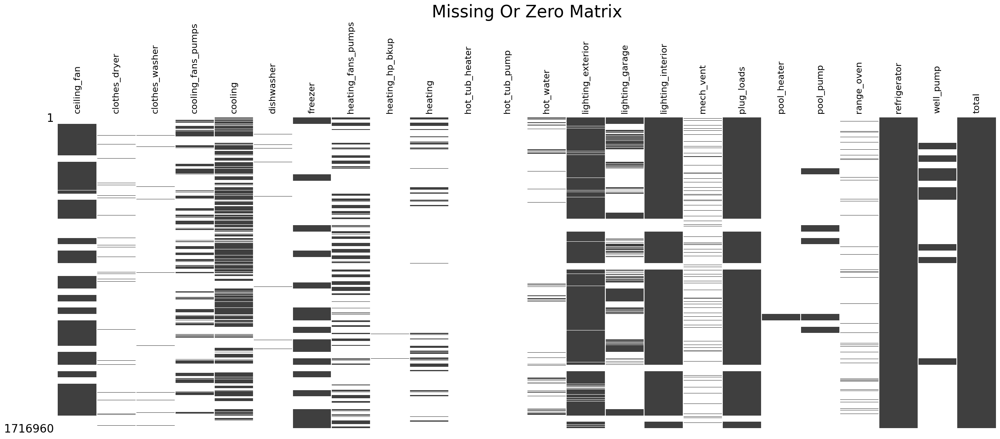

In [44]:
_df = (
    pd.concat(dfs, ignore_index=True)
    .map(lambda x: x if x > 0 else np.nan)
)

ax = msno.matrix(
    df=_df,
    figsize=(30, 10),
    labels=True,
    sparkline=False,
)

# rotate x-axis labels
_ = ax.set_xticklabels(ax.get_xticklabels(), rotation=90, horizontalalignment='center')
ax.set_title('Missing Or Zero Matrix', fontdict={'size': 30})

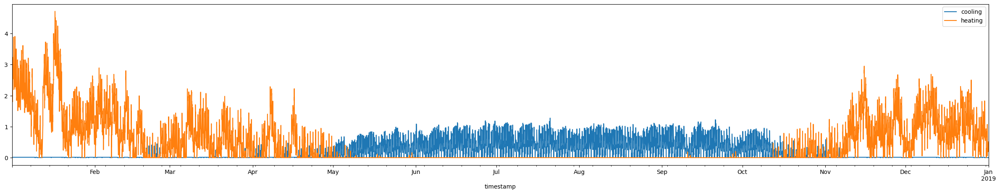

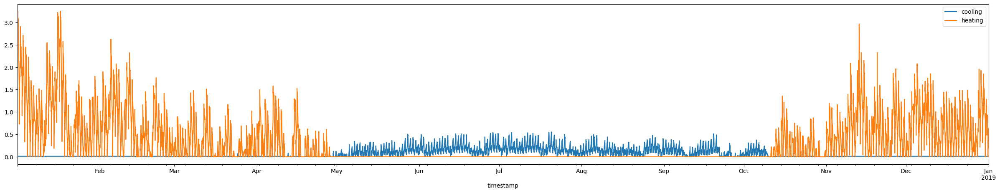

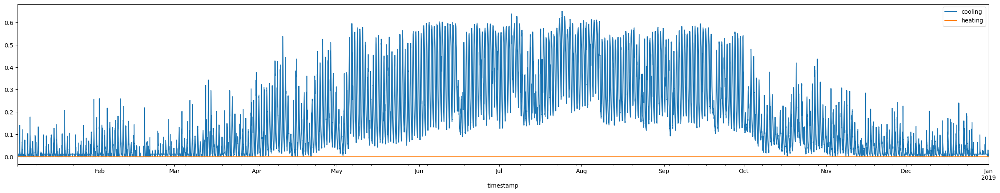

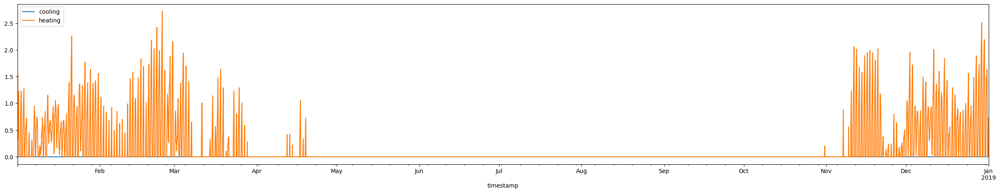

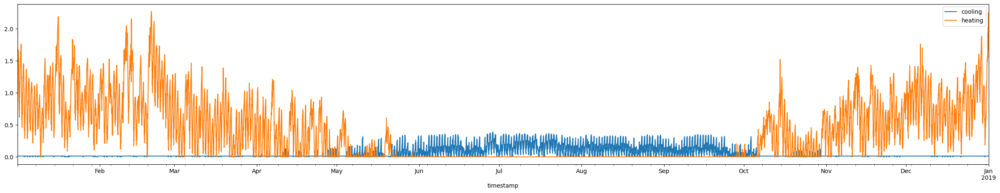

...

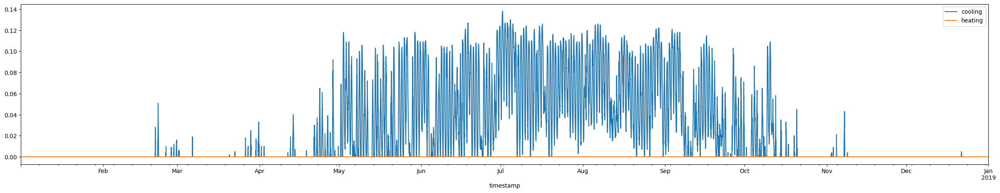

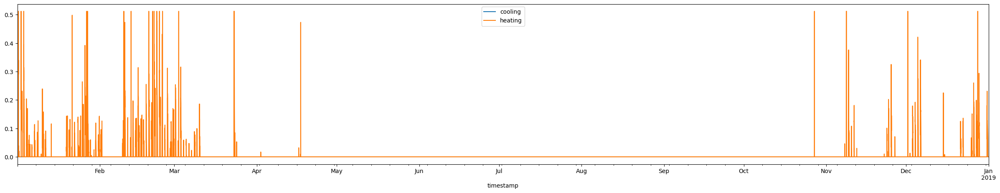

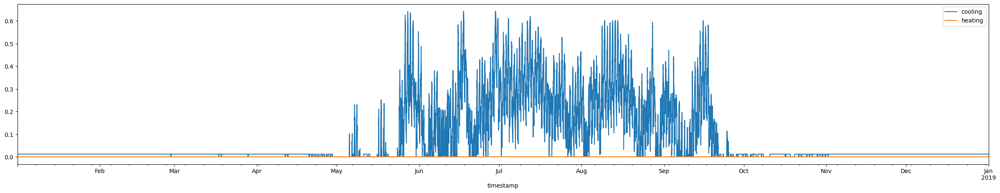

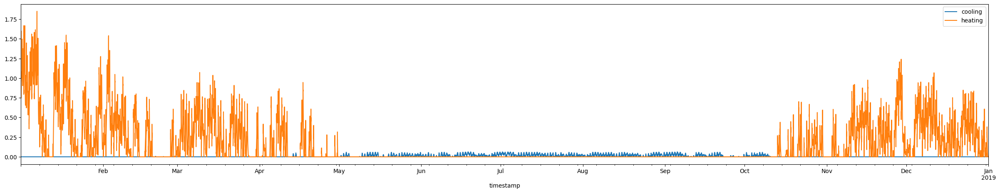

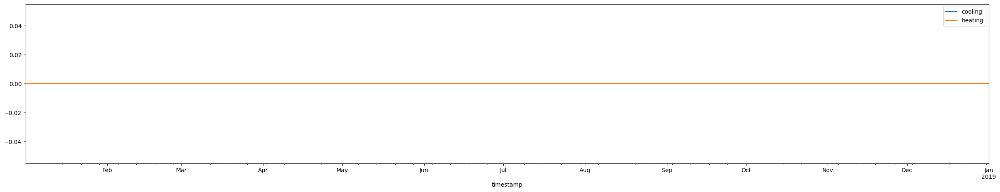

In [50]:
for _df in dfs:
    fig, ax = plt.subplots(figsize=(30, 5))
    _df[['cooling', 'heating']].plot(ax=ax)
    plt.show()